# Model Input — Blur Visualization

Shows what each model sees after its preprocessing pipeline when the **input image is Gaussian-blurred** at increasing σ values.

| Model | Input size | Normalization | Notes |
|---|---|---|---|
| **DepthAnything V2** | 518px longest-edge | ImageNet | Runs actual inference — outputs depth map |
| **SegGPT** | 448×448 (hard resize) | ImageNet | Processor only |
| **DINOv2** | 256 shortest-edge → 224×224 center-crop | ImageNet | Processor only |
| **Grounding DINO** | shortest-edge 800, longest ≤1333 | ImageNet | Processor only |
| **SAM2** | 1024×1024 | ImageNet | Processor only |
| **Qwen2.5-VL** | dynamic (multiples of 28) | CLIP | Processor only |

In [1]:
%load_ext autoreload
%autoreload 2

import json
from pathlib import Path
import sys

import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch.nn.functional as F

PROJECT_ROOT = Path.cwd().parent
sys.path.insert(0, str(PROJECT_ROOT))

from transformers import (
    AutoImageProcessor,
    AutoModelForDepthEstimation,
    AutoProcessor,
    GroundingDinoProcessor,
    Sam2Processor,
    SegGptImageProcessor,
)

/home/doterog/repos/uva/research/FOMO/touch_from_segmentation/.venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Load processors (no model weights)

In [2]:
_DEPTH_ID = "depth-anything/Depth-Anything-V2-Small-hf"

depth_processor  = AutoImageProcessor.from_pretrained(_DEPTH_ID)
seggpt_processor = SegGptImageProcessor.from_pretrained("BAAI/seggpt-vit-large")
dinov2_processor = AutoImageProcessor.from_pretrained("facebook/dinov2-base")
gdino_processor  = GroundingDinoProcessor.from_pretrained("IDEA-Research/grounding-dino-tiny")
sam2_processor   = Sam2Processor.from_pretrained("facebook/sam2-hiera-small")
qwen_processor   = AutoProcessor.from_pretrained("Qwen/Qwen2.5-VL-3B-Instruct")

## Load DepthAnything V2 model (~100 MB, CPU-friendly)

In [3]:
_depth_device = "cuda" if torch.cuda.is_available() else "cpu"
depth_model = AutoModelForDepthEstimation.from_pretrained(_DEPTH_ID).to(_depth_device).eval()
print(f"DepthAnything V2 loaded on {_depth_device}")

Loading weights: 100%|██████████| 287/287 [00:00<00:00, 1333.12it/s]


DepthAnything V2 loaded on cuda


## Load a sample

In [14]:
IMAGENET_MEAN = np.array([0.485, 0.456, 0.406], dtype=np.float32)
IMAGENET_STD  = np.array([0.229, 0.224, 0.225], dtype=np.float32)
CLIP_MEAN     = np.array([0.48145466, 0.4578275,  0.40821073], dtype=np.float32)
CLIP_STD      = np.array([0.26862954, 0.26130258, 0.27577711], dtype=np.float32)


def gaussian_blur(pil_img: Image.Image, sigma: float) -> Image.Image:
    if sigma <= 0:
        return pil_img
    k = max(3, int(6 * sigma + 1) | 1)
    arr = cv2.GaussianBlur(np.array(pil_img), (k, k), sigma)
    return Image.fromarray(arr)


def denorm(tensor_chw, mean=IMAGENET_MEAN, std=IMAGENET_STD) -> np.ndarray:
    arr = tensor_chw.numpy().transpose(1, 2, 0)
    arr = arr * std + mean
    return np.clip(arr * 255, 0, 255).astype(np.uint8)


def qwen_reconstruct(pixel_values: torch.Tensor, image_grid_thw: torch.Tensor) -> np.ndarray:
    t, h, w = image_grid_thw[0].tolist()
    C, tp, ph, pw = 3, 2, 14, 14
    pv = pixel_values.reshape(t, h, w, C, tp, ph, pw)
    pv = pv[0, :, :, :, 0, :, :]
    pv = pv.permute(2, 0, 3, 1, 4)
    pv = pv.reshape(C, int(h * ph), int(w * pw))
    return denorm(pv, mean=CLIP_MEAN, std=CLIP_STD)


# ---- per-model process functions ----

def depth_predict(pil_img: Image.Image) -> np.ndarray:
    """Run DepthAnything V2 → colorized depth map (HWC uint8, inferno colormap)."""
    inputs = depth_processor(images=pil_img, return_tensors="pt")
    inputs = {k: v.to(_depth_device) for k, v in inputs.items()}
    with torch.no_grad():
        depth_raw = depth_model(**inputs).predicted_depth   # (1, H', W')
    depth = F.interpolate(
        depth_raw.unsqueeze(1),
        size=(pil_img.height, pil_img.width),
        mode="bicubic",
        align_corners=False,
    ).squeeze().cpu().numpy()
    d_min, d_max = depth.min(), depth.max()
    depth_norm = (depth - d_min) / (d_max - d_min) if d_max > d_min else np.zeros_like(depth)
    return (plt.get_cmap("inferno")(depth_norm)[:, :, :3] * 255).astype(np.uint8)


def seggpt_process(pil_img):
    inputs = seggpt_processor(images=pil_img, prompt_images=pil_img, return_tensors="pt")
    pv = inputs["pixel_values"][0]
    return pv[:, pv.shape[1] // 2:, :]  # bottom half = query image

def dinov2_process(pil_img):
    return dinov2_processor(images=pil_img, return_tensors="pt")["pixel_values"][0]

def gdino_process(pil_img):
    return gdino_processor(images=pil_img, text="object", return_tensors="pt")["pixel_values"][0]

def sam2_process(pil_img):
    return sam2_processor(images=pil_img, return_tensors="pt")["pixel_values"][0]

_qwen_messages  = [{"role": "user", "content": [{"type": "image"}, {"type": "text", "text": "describe"}]}]
_qwen_chat_text = qwen_processor.apply_chat_template(_qwen_messages, tokenize=False, add_generation_prompt=True)

def qwen_process(pil_img):
    inputs = qwen_processor(text=[_qwen_chat_text], images=[pil_img], return_tensors="pt")
    return inputs["pixel_values"], inputs["image_grid_thw"]


def show_blur_grid(img_pil, sigmas, process_fn, model_name, denorm_fn=None):
    """One row per sigma: left = blurred input, right = model output.

    denorm_fn: called on process_fn's return value to produce HWC uint8.
               Defaults to ImageNet denorm. Pass `lambda x: x` if process_fn
               already returns a uint8 np.ndarray (e.g. depth_predict).
    """
    if denorm_fn is None:
        denorm_fn = denorm
    n = len(sigmas)
    fig, axes = plt.subplots(n, 2, figsize=(10, 4 * n))
    if n == 1:
        axes = [axes]
    for row, sigma in enumerate(sigmas):
        blurred   = gaussian_blur(img_pil, sigma)
        output    = denorm_fn(process_fn(blurred))
        label     = f"σ={sigma}  (no blur)" if sigma == 0 else f"σ={sigma}"
        axes[row][0].imshow(blurred)
        axes[row][0].set_title(f"Input — {label}")
        axes[row][0].axis("off")
        axes[row][1].imshow(output)
        axes[row][1].set_title(f"{model_name} output\n{output.shape[1]}×{output.shape[0]}px")
        axes[row][1].axis("off")
    fig.suptitle(f"{model_name} — Gaussian blur effect", fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.show()


SIGMAS = [0, 10, 20, 30, 50]  # ← edit to taste

In [19]:
GH_MASKS = PROJECT_ROOT / "data" / "epic_kitchen" / "annotations"


def resolve_hand_path(s: dict) -> Path | None:
    """Return the hand/stick mask path that exists on disk.

    Some manifests list hand_mask_path but only _stick.png files were written,
    and vice-versa. Tries both keys, then falls back to probing the image stem.
    """
    for key in ("hand_mask_path", "stick_mask_path"):
        val = s.get(key)
        if val and Path(val).exists():
            return Path(val)
    img_stem = Path(s.get("image_path", "")).stem
    folder   = Path(s.get("image_path", "")).parent
    for suffix in ("_stick.png", "_hand.png"):
        candidate = folder / (img_stem + suffix)
        if candidate.exists():
            return candidate
    return None


annotations_path = GH_MASKS / "train.json"
with open(annotations_path) as f:
    annotations = json.load(f)

sample = None
count = 0
for s in annotations:
    hand_path = resolve_hand_path(s)
    if hand_path is not None:
        sample = s
        count += 1
        if count >= 5:  # just pick the 5th usable sample to get some variety
            break

assert sample is not None, "No usable sample found — check GH_MASKS path"

touch_mask_key = "touch_mask_path" if "touch_mask_path" in sample else "target_path"

img_pil  = Image.open(sample["image_path"]).convert("RGB")
img_np   = np.array(img_pil)
hand_np  = np.array(Image.open(hand_path).convert("L"))
obj_np   = np.array(Image.open(sample["object_mask_path"]).convert("L"))
touch_np = np.array(Image.open(sample[touch_mask_key]).convert("L"))

print(f"Image : {img_np.shape}  —  {sample['image_path']}")
print(f"Hand  : {hand_path}")

Image : (1080, 1920, 3)  —  /home/doterog/repos/uva/research/FOMO/touch_from_segmentation/data/epic_kitchen/frames/P01_104/P01_104_frame_0000005176.jpg
Hand  : /home/doterog/repos/uva/research/FOMO/touch_from_segmentation/data/epic_kitchen/masks/P01_104/P01_104_frame_0000005176_p0_hand.png


---
## DepthAnything V2 — depth map degradation with blur

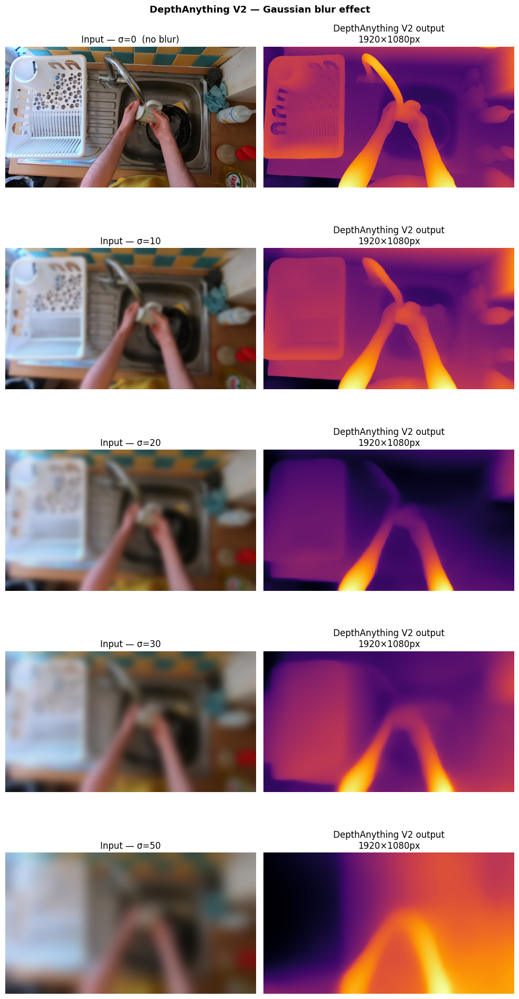

In [20]:
show_blur_grid(img_pil, SIGMAS, depth_predict, "DepthAnything V2", denorm_fn=lambda x: x)

## Helpers

In [23]:
IMAGENET_MEAN = np.array([0.485, 0.456, 0.406], dtype=np.float32)
IMAGENET_STD  = np.array([0.229, 0.224, 0.225], dtype=np.float32)
CLIP_MEAN     = np.array([0.48145466, 0.4578275,  0.40821073], dtype=np.float32)
CLIP_STD      = np.array([0.26862954, 0.26130258, 0.27577711], dtype=np.float32)


def gaussian_blur(pil_img: Image.Image, sigma: float) -> Image.Image:
    """Apply Gaussian blur with the given sigma. Returns the image unchanged if sigma=0."""
    if sigma <= 0:
        return pil_img
    k = max(3, int(6 * sigma + 1) | 1)  # odd kernel, at least 3
    arr = cv2.GaussianBlur(np.array(pil_img), (k, k), sigma)
    return Image.fromarray(arr)


def denorm(tensor_chw, mean=IMAGENET_MEAN, std=IMAGENET_STD) -> np.ndarray:
    """CHW float tensor → HWC uint8, undoing /255 + normalisation."""
    arr = tensor_chw.numpy().transpose(1, 2, 0)
    arr = arr * std + mean
    return np.clip(arr * 255, 0, 255).astype(np.uint8)


def qwen_reconstruct(pixel_values: torch.Tensor, image_grid_thw: torch.Tensor) -> np.ndarray:
    """Reconstruct a visible image from Qwen's flattened patch tensor."""
    t, h, w = image_grid_thw[0].tolist()
    C, tp, ph, pw = 3, 2, 14, 14
    pv = pixel_values.reshape(t, h, w, C, tp, ph, pw)
    pv = pv[0, :, :, :, 0, :, :]        # (h, w, C, ph, pw)
    pv = pv.permute(2, 0, 3, 1, 4)       # (C, h, ph, w, pw)
    pv = pv.reshape(C, int(h * ph), int(w * pw))
    return denorm(pv, mean=CLIP_MEAN, std=CLIP_STD)


# ---- per-model process functions ----

def seggpt_process(pil_img):
    inputs = seggpt_processor(images=pil_img, prompt_images=pil_img, return_tensors="pt")
    pv = inputs["pixel_values"][0]
    return pv[:, :, :]  # query half

def dinov2_process(pil_img):
    return dinov2_processor(images=pil_img, return_tensors="pt")["pixel_values"][0]

def gdino_process(pil_img):
    return gdino_processor(images=pil_img, text="object", return_tensors="pt")["pixel_values"][0]

def sam2_process(pil_img):
    return sam2_processor(images=pil_img, return_tensors="pt")["pixel_values"][0]

_qwen_messages  = [{"role": "user", "content": [{"type": "image"}, {"type": "text", "text": "describe"}]}]
_qwen_chat_text = qwen_processor.apply_chat_template(_qwen_messages, tokenize=False, add_generation_prompt=True)

def qwen_process(pil_img):
    inputs = qwen_processor(text=[_qwen_chat_text], images=[pil_img], return_tensors="pt")
    return inputs["pixel_values"], inputs["image_grid_thw"]


def show_blur_grid(img_pil, sigmas, process_fn, model_name, denorm_fn=None):
    """One row per sigma: left = blurred input, right = what the model sees."""
    if denorm_fn is None:
        denorm_fn = denorm
    n = len(sigmas)
    fig, axes = plt.subplots(n, 2, figsize=(10, 4 * n))
    if n == 1:
        axes = [axes]
    for row, sigma in enumerate(sigmas):
        blurred = gaussian_blur(img_pil, sigma)
        processed = denorm_fn(process_fn(blurred))
        label = f"σ={sigma}  (no blur)" if sigma == 0 else f"σ={sigma}"
        axes[row][0].imshow(blurred)
        axes[row][0].set_title(f"Input — {label}")
        axes[row][0].axis("off")
        axes[row][1].imshow(processed)
        axes[row][1].set_title(f"{model_name} sees\n{processed.shape[1]}×{processed.shape[0]}px")
        axes[row][1].axis("off")
    fig.suptitle(f"{model_name} — Gaussian blur effect", fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.show()


SIGMAS = [0, 10, 20, 30, 50]  # ← edit to taste

---
## SegGPT

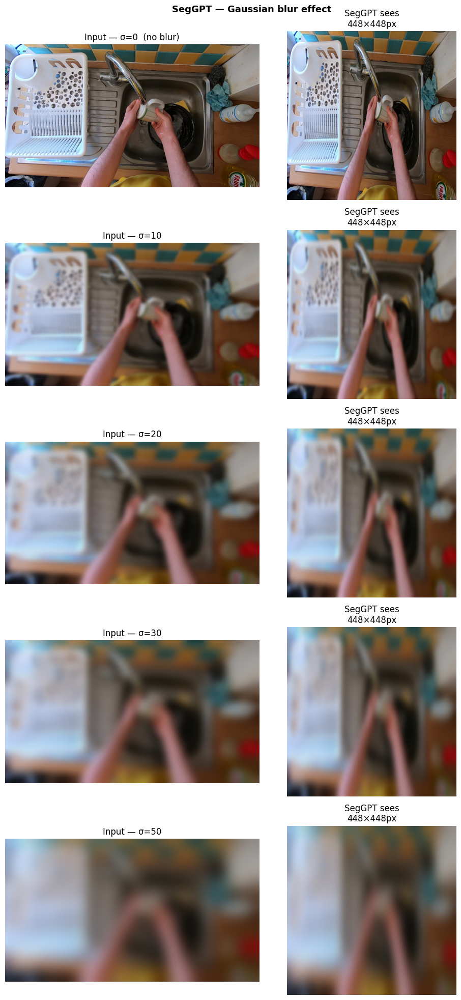

In [24]:
show_blur_grid(img_pil, SIGMAS, seggpt_process, "SegGPT")

---
## DINOv2

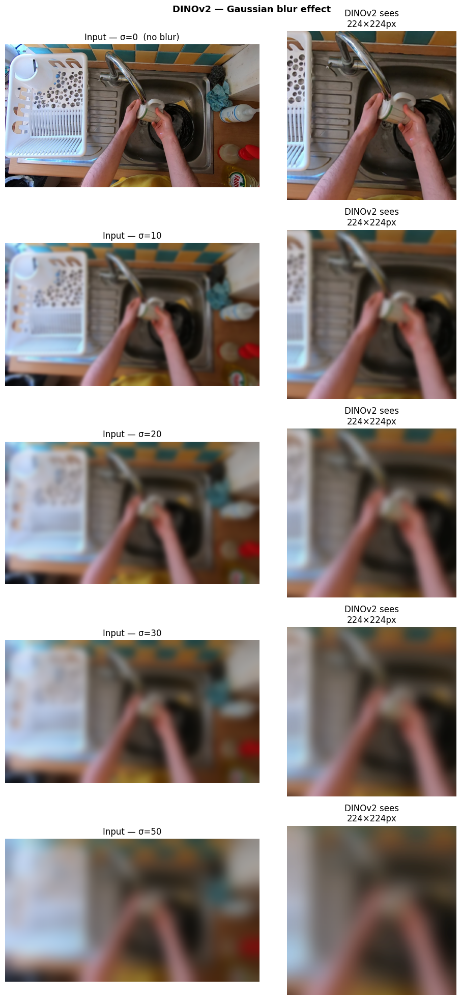

In [25]:
show_blur_grid(img_pil, SIGMAS, dinov2_process, "DINOv2")

---
## Grounding DINO

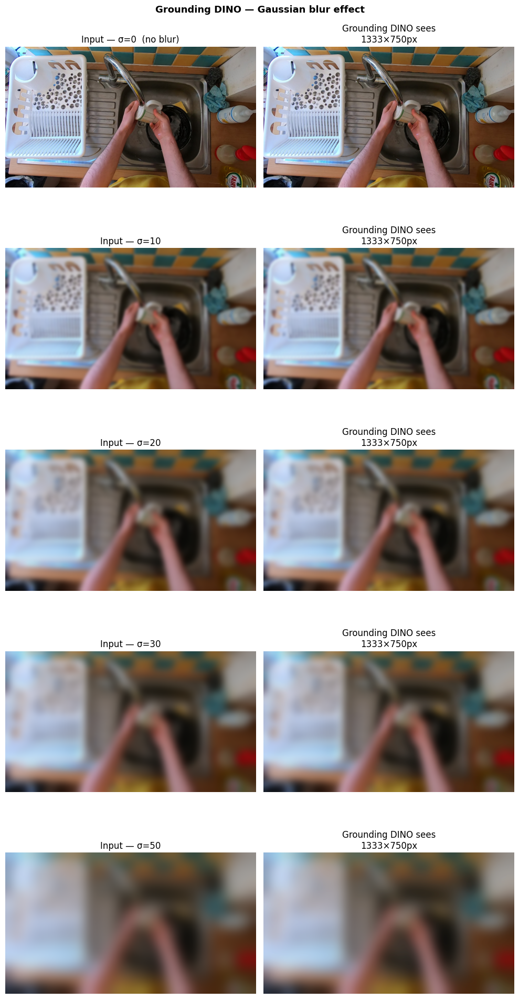

In [26]:
show_blur_grid(img_pil, SIGMAS, gdino_process, "Grounding DINO")

---
## SAM2

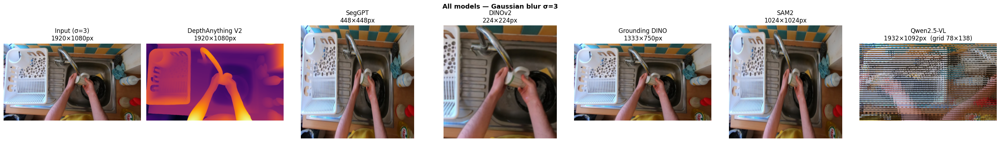

In [27]:
SIGMA = 3  # ← change this

blurred = gaussian_blur(img_pil, SIGMA)

depth_out  = depth_predict(blurred)
seggpt_out = denorm(seggpt_process(blurred))
dinov2_out = denorm(dinov2_process(blurred))
gdino_out  = denorm(gdino_process(blurred))
sam2_out   = denorm(sam2_process(blurred))
qwen_pv, qwen_grid = qwen_process(blurred)
qwen_out   = qwen_reconstruct(qwen_pv, qwen_grid)
qt, qh, qw = qwen_grid[0].tolist()

images = [np.array(blurred), depth_out, seggpt_out, dinov2_out, gdino_out, sam2_out, qwen_out]
titles = [
    f"Input (σ={SIGMA})\n{blurred.size[0]}×{blurred.size[1]}px",
    f"DepthAnything V2\n{depth_out.shape[1]}×{depth_out.shape[0]}px",
    f"SegGPT\n{seggpt_out.shape[1]}×{seggpt_out.shape[0]}px",
    f"DINOv2\n{dinov2_out.shape[1]}×{dinov2_out.shape[0]}px",
    f"Grounding DINO\n{gdino_out.shape[1]}×{gdino_out.shape[0]}px",
    f"SAM2\n{sam2_out.shape[1]}×{sam2_out.shape[0]}px",
    f"Qwen2.5-VL\n{qw*14}×{qh*14}px  (grid {qh}×{qw})",
]

fig, axes = plt.subplots(1, 7, figsize=(28, 4))
for ax, img, title in zip(axes, images, titles):
    ax.imshow(img)
    ax.set_title(title)
    ax.axis("off")

fig.suptitle(f"All models — Gaussian blur σ={SIGMA}", fontsize=13, fontweight="bold")
plt.tight_layout()
plt.show()

---
## Qwen2.5-VL

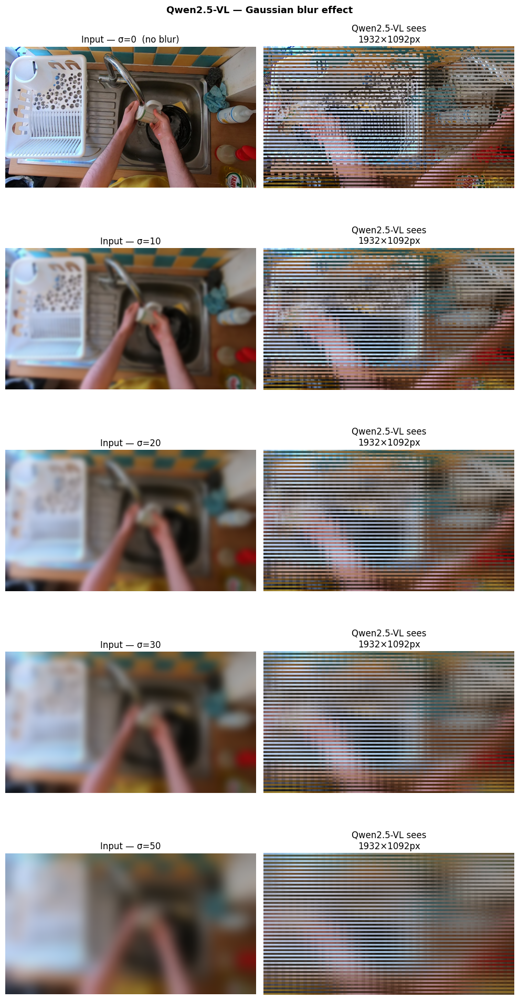

In [28]:
def qwen_denorm_fn(result):
    pv, grid = result
    return qwen_reconstruct(pv, grid)

show_blur_grid(img_pil, SIGMAS, qwen_process, "Qwen2.5-VL", denorm_fn=qwen_denorm_fn)

---
## All models side-by-side at one sigma

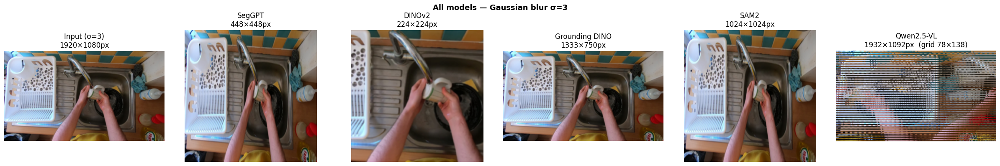

In [29]:
SIGMA = 3  # ← change this

blurred = gaussian_blur(img_pil, SIGMA)

seggpt_out = denorm(seggpt_process(blurred))
dinov2_out = denorm(dinov2_process(blurred))
gdino_out  = denorm(gdino_process(blurred))
sam2_out   = denorm(sam2_process(blurred))
qwen_pv, qwen_grid = qwen_process(blurred)
qwen_out   = qwen_reconstruct(qwen_pv, qwen_grid)
qt, qh, qw = qwen_grid[0].tolist()

images = [np.array(blurred), seggpt_out, dinov2_out, gdino_out, sam2_out, qwen_out]
titles = [
    f"Input (σ={SIGMA})\n{blurred.size[0]}×{blurred.size[1]}px",
    f"SegGPT\n{seggpt_out.shape[1]}×{seggpt_out.shape[0]}px",
    f"DINOv2\n{dinov2_out.shape[1]}×{dinov2_out.shape[0]}px",
    f"Grounding DINO\n{gdino_out.shape[1]}×{gdino_out.shape[0]}px",
    f"SAM2\n{sam2_out.shape[1]}×{sam2_out.shape[0]}px",
    f"Qwen2.5-VL\n{qw*14}×{qh*14}px  (grid {qh}×{qw})",
]

fig, axes = plt.subplots(1, 6, figsize=(24, 4))
for ax, img, title in zip(axes, images, titles):
    ax.imshow(img)
    ax.set_title(title)
    ax.axis("off")

fig.suptitle(f"All models — Gaussian blur σ={SIGMA}", fontsize=13, fontweight="bold")
plt.tight_layout()
plt.show()